In [1]:
#Processing xml data feed from CVE/NVD to CSV File 
import xml.etree.ElementTree as ET

col="cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime"
namespaces={'scap-core':"http://scap.nist.gov/schema/scap-core/0.1"
            ,'cvss':"http://scap.nist.gov/schema/cvss-v2/0.2",
            'vuln':"http://scap.nist.gov/schema/vulnerability/0.4",
            'xsi':"http://www.w3.org/2001/XMLSchema-instance",
            'patch':"http://scap.nist.gov/schema/patch/0.1",
            'xmlns':"http://scap.nist.gov/schema/feed/vulnerability/2.0",
            'cpe-lang':"http://cpe.mitre.org/language/2.0"
            }

file=open('cvss.csv','w')
file.write(col)
file.write("\n")

xml_files=['nvdcve-2.0-2017.xml','nvdcve-2.0-2016.xml','nvdcve-2.0-2015.xml','nvdcve-2.0-2014.xml','nvdcve-2.0-2013.xml','nvdcve-2.0-2012.xml','nvdcve-2.0-2011.xml','nvdcve-2.0-2010.xml']
for xml in xml_files:
    tree = ET.parse(xml)
    root = tree.getroot()
    c=0
    for entry in root.getchildren():
        data=[]
        cveEntry=entry.attrib['id']
        summary=entry.find('vuln:summary',namespaces).text
        summary=summary.replace(",",";")
        vulnProducts=""
        publishDate=entry.find('vuln:published-datetime',namespaces).text
        publishDate=publishDate[:publishDate.find(".")]
        publishDate=publishDate.replace("T"," ")
        lastDate=entry.find('vuln:last-modified-datetime',namespaces).text
        lastDate=lastDate[:lastDate.find(".")]
        lastDate=lastDate.replace("T"," ")
        softList = entry.find('vuln:vulnerable-software-list', namespaces)
        if softList!=None:
            for  prod in softList.getchildren():
                if prod!=softList[-1]:
                    vulnProducts+=prod.text + " "
                else:
                    vulnProducts+=prod.text
        data.append(cveEntry)
        data.append(summary)
        data.append(vulnProducts)
        data.append(publishDate)
        data.append(lastDate)
        cvss=entry.find('vuln:cvss',namespaces)
        if cvss!=None:
            cvss=cvss.find('cvss:base_metrics',namespaces)
            cvssScore=cvss.find('cvss:score',namespaces).text
            accessVec=cvss.find('cvss:access-vector',namespaces).text
            accessComplex=cvss.find('cvss:access-complexity',namespaces).text
            authentication=cvss.find('cvss:authentication',namespaces).text
            confidentiality=cvss.find('cvss:confidentiality-impact',namespaces).text
            integrity=cvss.find('cvss:integrity-impact',namespaces).text
            availability=cvss.find('cvss:availability-impact',namespaces).text
            generatedOn=cvss.find('cvss:generated-on-datetime',namespaces).text
            generatedOn=generatedOn[:generatedOn.find(".")]
            generatedOn=generatedOn.replace("T"," ")
            data.append(cvssScore)
            data.append(accessVec)
            data.append(accessComplex)
            data.append(authentication)
            data.append(confidentiality)
            data.append(integrity)
            data.append(availability)
            data.append(generatedOn)
        data=",".join(data)
        print(data)
        file.write(data)
        file.write('\n')
        c+=1
    print(c)
file.close()

CVE-2017-0001,The Graphics Device Interface (GDI) in Microsoft Windows Vista SP2; Windows Server 2008 SP2 and R2 SP1; Windows 7 SP1; Windows 8.1; Windows Server 2012 Gold and R2; Windows RT 8.1; and Windows 10 Gold; 1511; and 1607 allows local users to gain privileges via a crafted application; aka "Windows GDI Elevation of Privilege Vulnerability." This vulnerability is different from those described in CVE-2017-0005; CVE-2017-0025; and CVE-2017-0047.,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microsoft:windows_rt_8.1 cpe:/o:microsoft:windows_10:1511 cpe:/o:microsoft:windows_10:- cpe:/o:microsoft:windows_server_2012:r2 cpe:/o:microsoft:windows_server_2008::sp2 cpe:/o:microsoft:windows_vista::sp2 cpe:/o:microsoft:windows_10:1607 cpe:/o:microsoft:windows_server_2012:- cpe:/o:microsoft:windows_8.1 cpe:/o:microsoft:windows_server_2008:r2:sp1,2017-03-16 20:59:00,2017-07-11 21:29:03,7.2,LOCAL,LOW,NONE,COMPLETE,COMPLETE,COMPLETE,2017-03-21 16:19:00
CVE-2017-0002,Microsoft Edge allows remote atta

CVE-2017-0236,A remote code execution vulnerability exists in Microsoft Edge in the way that the Chakra JavaScript engine renders when handling objects in memory; aka "Scripting Engine Memory Corruption Vulnerability." This CVE ID is unique from CVE-2017-0224; CVE-2017-0228; CVE-2017-0229; CVE-2017-0230; CVE-2017-0234; CVE-2017-0235; and CVE-2017-0238.,cpe:/a:microsoft:edge,2017-05-12 10:29:02,2017-07-07 21:29:03,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-05-23 10:57:04
CVE-2017-0238,A remote code execution vulnerability exists in Microsoft browsers in the way JavaScript scripting engines handle objects in memory; aka "Scripting Engine Memory Corruption Vulnerability." This CVE ID is unique from CVE-2017-0224; CVE-2017-0228; CVE-2017-0229; CVE-2017-0230; CVE-2017-0234; CVE-2017-0235; and CVE-2017-0236.,cpe:/a:microsoft:internet_explorer:10 cpe:/a:microsoft:edge cpe:/a:microsoft:internet_explorer:11 cpe:/a:microsoft:internet_explorer:9,2017-05-12 10:29:03,2017-05-23 14:39:23,

CVE-2017-11503,PHPMailer 5.2.23 has XSS in the "From Email Address" and "To Email Address" fields of code_generator.php.,cpe:/a:phpmailer_project:phpmailer:5.2.23,2017-07-20 19:29:00,2017-08-02 21:29:00,4.3,NETWORK,MEDIUM,NONE,NONE,PARTIAL,NONE,2017-07-27 09:23:49
CVE-2017-11505,The ReadOneJNGImage function in coders/png.c in ImageMagick through 6.9.9-0 and 7.x through 7.0.6-1 allows remote attackers to cause a denial of service (large loop and CPU consumption) via a malformed JNG file.,cpe:/a:imagemagick:imagemagick:7.0.5-4 cpe:/a:imagemagick:imagemagick:7.0.3-6 cpe:/a:imagemagick:imagemagick:7.0.1-8 cpe:/a:imagemagick:imagemagick:7.0.5-3 cpe:/a:imagemagick:imagemagick:7.0.3-5 cpe:/a:imagemagick:imagemagick:7.0.1-7 cpe:/a:imagemagick:imagemagick:7.0.5-2 cpe:/a:imagemagick:imagemagick:7.0.3-4 cpe:/a:imagemagick:imagemagick:7.0.1-6 cpe:/a:imagemagick:imagemagick:7.0.5-1 cpe:/a:imagemagick:imagemagick:7.0.3-3 cpe:/a:imagemagick:imagemagick:7.0.1-5 cpe:/a:imagemagick:imagemagick:7.0.5-0 c

CVE-2017-2410,An issue was discovered in certain Apple products. macOS before 10.12.4 is affected. The issue involves the "Kernel" component. It allows attackers to execute arbitrary code in a privileged context via a crafted app.,cpe:/o:apple:mac_os_x:10.12.3,2017-04-01 21:59:01,2017-07-11 21:29:10,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-06 14:18:24
CVE-2017-2412,An issue was discovered in certain Apple products. iOS before 10.3 is affected. The issue involves the "iTunes Store" component. It allows man-in-the-middle attackers to modify the client-server data stream to iTunes sandbox web services by leveraging use of cleartext HTTP.,cpe:/o:apple:iphone_os:10.2.1,2017-04-01 21:59:01,2017-07-11 21:29:10,4.3,NETWORK,MEDIUM,NONE,NONE,PARTIAL,NONE,2017-04-06 14:28:47
CVE-2017-2413,An issue was discovered in certain Apple products. macOS before 10.12.4 is affected. The issue involves the "QuickTime" component. It allows remote attackers to execute arbitrary code or cause 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2017-9187,libautotrace.a in AutoTrace 0.31.1 has a "cannot be represented in type int" issue in input-bmp.c:486:7.,cpe:/a:autotrace_project:autotrace:0.31.1,2017-05-23 00:29:03,2017-05-28 12:02:55,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2017-05-27 17:54:38
CVE-2017-9188,libautotrace.a in AutoTrace 0.31.1 has a "left shift ... cannot be represented in type int" issue in input-bmp.c:516:63.,cpe:/a:autotrace_project:autotrace:0.31.1,2017-05-23 00:29:03,2017-05-28 11:53:20,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2017-05-27 16:15:50
CVE-2017-9189,libautotrace.a in AutoTrace 0.31.1 allows remote attackers to cause a denial of service (invalid read and application crash); related to the GET_COLOR function in color.c:16:11.,cpe:/a:autotrace_project:autotrace:0.31.1,2017-05-23 00:29:03,2017-05-28 11:52:44,5.0,NETWORK,LOW,NONE,NONE,NONE,PARTIAL,2017-05-27 16:39:08
CVE-2017-9190,libautotrace.a in AutoTrace 0.31.1 allows remote attackers to cause a denial of service (invalid free); r

CVE-2016-0913,The client in EMC Replication Manager (RM) before 5.5.3.0_01-PatchHotfix; EMC Network Module for Microsoft 3.x; and EMC Networker Module for Microsoft 8.2.x before 8.2.3.6 allows remote RM servers to execute arbitrary commands by placing a crafted script in an SMB share.,cpe:/a:emc:networker_module_for_microsoft_applications:3.0.1 cpe:/a:emc:networker_module_for_microsoft_applications:8.2.3.6 cpe:/a:emc:replication_manager:5.5.3 cpe:/a:emc:networker_module_for_microsoft_applications:3.0,2016-10-04 21:59:05,2017-07-29 21:29:01,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2016-10-05 15:01:01
CVE-2016-0914,EMC Documentum WebTop 6.8 before Patch 13 and 6.8.1 before Patch 02; Documentum Administrator 7.x before 7.2 Patch 13; Documentum Capital Projects 1.9 before Patch 23 and 1.10 before Patch 10; and Documentum TaskSpace 6.7 SP3 allow remote authenticated users to bypass intended access restrictions and execute arbitrary IAPI/IDQL commands via the IAPI/IDQL interface.,cpe:/a:

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2016-9175,** REJECT **  DO NOT USE THIS CANDIDATE NUMBER. ConsultIDs: none. Reason: The CNA or individual who requested this candidate did not associate it with any vulnerability during 2016. Notes: none.,,2017-05-11 10:30:17,2017-05-11 10:30:17
CVE-2016-9176,Stack buffer overflow in the send.exe and receive.exe components of Micro Focus Rumba 9.4 and earlier could be used by local attackers or attackers able to inject arguments to these binaries to execute code.,cpe:/a:microfocus:rumba:9.4.0,2016-11-03 20:59:00,2016-11-29 14:06:57,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2016-11-29 13:59:06
CVE-2016-9177,Directory traversal vulnerability in Spark 2.5 allows remote attackers to read arbitrary files via a .. (dot dot) in the URI.,cpe:/a:sparkjava:spark:2.5,2016-11-04 06:59:00,2016-11-29 13:58:52,5.0,NETWORK,LOW,NONE,PARTIAL,NONE,NONE,2016-11-29 13:58:23
CVE-2016-9178,The __get_user_asm_ex macro in arch/x86/include/asm/uaccess.h in the Linux kernel before 4.7.5 does not initializ

CVE-2015-0873,Cross-site scripting (XSS) vulnerability in Homepage Decorator PerlTreeBBS 2.30 and earlier allows remote attackers to inject arbitrary web script or HTML via unspecified vectors.,cpe:/a:homepage_decorator:perltreebbs:2.30,2015-02-12 21:59:09,2015-02-13 18:34:02,4.3,NETWORK,MEDIUM,NONE,NONE,PARTIAL,NONE,2015-02-13 12:21:32
CVE-2015-0875,The Ogaki Kyoritsu Bank Smartphone Passbook application 1.0.0 for Android creates a log file containing input data from the user; which allows attackers to obtain sensitive information by reading a file.,cpe:/a:okb.co.jp:smartphone_passbook:1.00::~~~android~~,2015-02-14 21:59:00,2015-02-19 20:56:25,1.8,ADJACENT_NETWORK,HIGH,NONE,PARTIAL,NONE,NONE,2015-02-19 14:30:27
CVE-2015-0876,Multiple cross-site scripting (XSS) vulnerabilities in the print_language_selectbox function in classes/adminpage.inc.php in Saurus CMS Community Edition before 4.7 2015-02-04 allow remote attackers to inject arbitrary web script or HTML via unspecified vectors.,c

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



CVE-2015-8524,Cross-site scripting (XSS) vulnerability in Process Portal in IBM Business Process Manager 8.5.0.x through 8.5.0.2; 8.5.5.x through 8.5.5.0; and 8.5.6.x through 8.5.6.2 allows remote attackers to inject arbitrary web script or HTML via a crafted URL.,cpe:/a:ibm:business_process_manager:8.5.6.2::~~standard~~~ cpe:/a:ibm:business_process_manager:8.5.6.2::~~express~~~ cpe:/a:ibm:business_process_manager:8.5.0.0::~~advanced~~~ cpe:/a:ibm:business_process_manager:8.5.6.0::~~express~~~ cpe:/a:ibm:business_process_manager:8.5.0.1::~~advanced~~~ cpe:/a:ibm:business_process_manager:8.5.5.0::~~express~~~ cpe:/a:ibm:business_process_manager:8.5.0.2::~~advanced~~~ cpe:/a:ibm:business_process_manager:8.5.5.0::~~standard~~~ cpe:/a:ibm:business_process_manager:8.5.6.0::~~standard~~~ cpe:/a:ibm:business_process_manager:8.5.5.0::~~advanced~~~ cpe:/a:ibm:business_process_manager:8.5.0.2::~~express~~~ cpe:/a:ibm:business_process_manager:8.5.0.0::~~standard~~~ cpe:/a:ibm:business_process_ma

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2014-4244,Unspecified vulnerability in Oracle Java SE 5.0u65; 6u75; 7u60; and 8u5; and JRockit R27.8.2 and JRockit R28.3.2; allows remote attackers to affect confidentiality and integrity via unknown vectors related to Security.,cpe:/a:oracle:jdk:1.7.0:update_60 cpe:/a:oracle:jre:1.8.0:update_5 cpe:/a:oracle:jre:1.6.0:update_75 cpe:/a:oracle:jrockit:r27.8.2 cpe:/a:oracle:jre:1.7.0:update_60 cpe:/a:oracle:jdk:1.8.0:update_5 cpe:/a:oracle:jdk:1.5.0:update_65 cpe:/a:oracle:jre:1.5.0:update_65 cpe:/a:oracle:jrockit:r28.3.2 cpe:/a:oracle:jdk:1.6.0:update_75,2014-07-17 07:17:10,2017-01-06 22:00:14,4.0,NETWORK,HIGH,NONE,PARTIAL,PARTIAL,NONE,2014-07-17 12:10:52
CVE-2014-4245,Unspecified vulnerability in the RDBMS Core component in Oracle Database Server 11.1.0.7; 11.2.0.3; 11.2.0.4; and 12.1.0.1 allows remote authenticated users to affect confidentiality via unknown vectors.,cpe:/a:oracle:database_server:11.1.0.7 cpe:/a:oracle:database_server:11.2.0.4 cpe:/a:oracle:database_server:11.2.0.3

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2014-9101,Multiple cross-site request forgery (CSRF) vulnerabilities in Oxwall 1.7.0 (build 7907 and 7906) and SkaDate Lite 2.0 (build 7651) allow remote attackers to hijack the authentication of administrators for requests that conduct cross-site scripting (XSS) attacks or possibly have other unspecified impact via the (1) label parameter to admin/users/roles/; (2) lang[1][base][questions_account_type_5615100a931845eca8da20cfdf7327e0] in an AddAccountType action or (3) qst_name parameter in an addQuestion action to admin/questions/ajax-responder/; or (4) form_name or (5) restrictedUsername parameter to admin/restricted-usernames.,cpe:/a:oxwall:oxwall:1.7.0 cpe:/a:skalfa:skadate_lite:2.0,2014-11-26 10:59:17,2015-02-18 13:53:35,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2015-02-18 13:47:39
CVE-2014-9102,Multiple SQL injection vulnerabilities in the Kunena component before 3.0.6 for Joomla! allow remote authenticated users to execute arbitrary SQL commands via the index value in

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2012-0745,The getpwnam function in IBM AIX 5.3; 6.1; and 7.1 and VIOS 2.1.0.10 through 2.2.1.3 does not properly interact with customer-extended LDAP user filtering; which allows local users to gain privileges via unspecified vectors.,cpe:/a:ibm:vios:2.2.0.12 cpe:/a:ibm:vios:2.2.0.11 cpe:/a:ibm:vios:2.1.3.10 cpe:/a:ibm:vios:2.1.2.12 cpe:/a:ibm:vios:2.2.0.10 cpe:/a:ibm:vios:2.1.2.13 cpe:/a:ibm:vios:2.2.1.0 cpe:/a:ibm:vios:2.2.1.1 cpe:/a:ibm:vios:2.2.0.13 cpe:/a:ibm:vios:2.2.1.3 cpe:/a:ibm:vios:2.1.0.10 cpe:/o:ibm:aix:6.1 cpe:/o:ibm:aix:5.3 cpe:/o:ibm:aix:7.1,2012-05-04 12:55:01,2013-01-03 23:35:49,7.2,LOCAL,LOW,NONE,COMPLETE,COMPLETE,COMPLETE,2012-05-07 09:10:00
CVE-2012-0746,Cross-site scripting (XSS) vulnerability in IBM Maximo Asset Management 7.5; as used in SmartCloud Control Desk; Tivoli Asset Management for IT; Tivoli Service Request Manager; Maximo Service Desk; and Change and Configuration Management Database (CCMDB); allows remote authenticated users to inject arbitrary we

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2012-5853,SQL injection vulnerability in the "the_search_function" function in cardoza_ajax_search.php in the AJAX Post Search (cardoza-ajax-search) plugin before 1.3 for WordPress allows remote attackers to execute arbitrary SQL commands via the srch_txt parameter in a "the_search_text" action to wp-admin/admin-ajax.php.,cpe:/a:ajax_post_search_project:ajax_post_search:1.2::~~~wordpress~~,2015-01-07 20:59:00,2015-01-08 14:04:30,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2015-01-08 10:22:30
CVE-2012-5854,Heap-based buffer overflow in WeeChat 0.3.6 through 0.3.9 allows remote attackers to cause a denial of service (crash or hang) and possibly execute arbitrary code via crafted IRC colors that are not properly decoded.,cpe:/a:flashtux:weechat:0.3.9 cpe:/a:flashtux:weechat:0.3.8 cpe:/a:flashtux:weechat:0.3.7 cpe:/a:flashtux:weechat:0.3.6,2012-11-19 07:10:54,2014-02-06 23:43:45,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2012-11-19 10:58:00
CVE-2012-5855,The SHAddToRecentDocs functi

CVE-2011-0141,WebKit; as used in Apple iTunes before 10.2 on Windows; allows man-in-the-middle attackers to execute arbitrary code or cause a denial of service (memory corruption and application crash) via vectors related to iTunes Store browsing; a different vulnerability than other CVEs listed in APPLE-SA-2011-03-02-1.,cpe:/a:apple:itunes:5.0 cpe:/a:apple:itunes:9.0.3 cpe:/a:apple:itunes:9.2.1 cpe:/a:apple:itunes:4.7.2 cpe:/a:apple:itunes:4.9.0 cpe:/a:apple:itunes:7.0.0 cpe:/a:apple:itunes:7.0.1 cpe:/a:apple:itunes:7.7 cpe:/a:apple:itunes:10.1 cpe:/a:apple:itunes:10.0 cpe:/a:apple:itunes:7.4.0 cpe:/a:apple:itunes:7.0.2 cpe:/a:apple:itunes:7.2.0 cpe:/a:apple:itunes:10.1.2 cpe:/a:apple:itunes:10.1.1 cpe:/a:apple:itunes:4.7.1 cpe:/a:apple:itunes:8.1.1 cpe:/a:apple:itunes:4.1.0 cpe:/a:apple:itunes:7.6.2 cpe:/a:apple:itunes:7.4.2 cpe:/a:apple:itunes:7.6.0 cpe:/a:apple:itunes:7.4.3 cpe:/a:apple:itunes:7.6.1 cpe:/a:apple:itunes:4.5.0 cpe:/a:apple:itunes:4.7.0 cpe:/a:apple:itunes:6.0.4.2 cpe

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


CVE-2011-4345,Cross-site scripting (XSS) vulnerability in Namazu before 2.0.21; when Internet Explorer 6 or 7 is used; allows remote attackers to inject arbitrary web script or HTML via a cookie.,cpe:/a:namazu:namazu:2.0.12 cpe:/a:namazu:namazu:2.0.13 cpe:/a:namazu:namazu:2.0.14 cpe:/a:namazu:namazu:2.0.15 cpe:/a:namazu:namazu:2.0.16 cpe:/a:namazu:namazu:2.0.17 cpe:/a:namazu:namazu:2.0.18 cpe:/a:namazu:namazu:2.0.2 cpe:/a:namazu:namazu:2.0.19 cpe:/a:namazu:namazu:2.0 cpe:/a:namazu:namazu:2.0.20,2011-11-29 23:05:58,2017-02-16 21:59:00,2.6,NETWORK,HIGH,NONE,NONE,PARTIAL,NONE,2011-11-30 14:01:00
CVE-2011-4346,Cross-site scripting (XSS) vulnerability in the web interface in Red Hat Network (RHN) Satellite 5.4.1 allows remote authenticated users to inject arbitrary web script or HTML via the Description field of the asset tag in a Custom Info page.,cpe:/a:red_hat:network_satellite:5.4.1,2011-12-10 12:55:01,2011-12-12 00:00:00,3.5,NETWORK,MEDIUM,SINGLE_INSTANCE,NONE,PARTIAL,NONE,2011-12-12 0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [56]:
#LOADING EXPLOIT-DB DATABASE
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

exploits_data=pd.read_csv("exploits_db.csv",index_col=None)
exploits_data=exploits_data.dropna()
exploits_data

,description,platform,exploit_verification,date_published,exploit_id,cve-entry,type
1,Xamarin Studio for Mac 6.2.1 (build 3) / 6.3 (...,macOS,2,2017-08-14,42454,CVE-2017-8665,Local
2,Quali CloudShell 7.1.0.6508 (Patch 6) - Persis...,Windows,1,2017-08-14,42453,CVE-2017-9767,Webapps
10,Microsoft Edge 38.14393.1066.0 - 'textarea.def...,Win_x86-64,2,2017-08-10,42445,CVE-2017-8652,Dos
11,Red-Gate SQL Monitor < 3.10 / 4.2 - Authentica...,Windows,1,2017-08-10,42444,CVE-2015-9098,Webapps
21,Synology Photo Station 6.7.3-3432 / 6.3-2967 -...,Hardware,2,2017-08-08,42434,CVE-2017-11151...,Webapps
22,WildMIDI 0.4.2 - Multiple Vulnerabilities,Linux,1,2017-08-08,42433,CVE-2017-11661...,Dos
26,Microsoft Windows - '.LNK' Shortcut File Code ...,Windows,1,2017-08-06,42429,CVE-2017-8464,Local
28,Technicolor TC7337 - 'SSID' Persistent Cross-S...,Hardware,1,2017-08-03,42427,CVE-2017-11320,Webapps
29,VirtualBox 5.1.22 - Windows Process DLL UNC Pa...,Windows,2,2017-08-03,42426,CVE-2017-10129,Local
30,VirtualBox 5.1.22 - Windows Process DLL Signat...,Windows,2,2017-08-03,42425,CVE-2017-10204,Local


In [2]:
#Loading CVE DATABASE
dateparse = lambda x: pd.datetime.strptime(x, '%Y-%m')
bins=[0,3.9,6.9,8.9,10]
severity_labels=["Low","Medium","High","Critical"]

data=pd.read_csv("cvss.csv",sep=",",index_col=None,date_parser=dateparse)
data["Severity"]=pd.cut(data["cvss-score"].values,bins,labels=severity_labels)
data

,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity
0,CVE-2017-0001,The Graphics Device Interface (GDI) in Microso...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:00,2017-07-11 21:29:03,7.2,LOCAL,LOW,NONE,COMPLETE,COMPLETE,COMPLETE,2017-03-21 16:19:00,High
1,CVE-2017-0002,Microsoft Edge allows remote attackers to bypa...,cpe:/a:microsoft:edge,2017-01-10 16:59:00,2017-01-17 21:59:18,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-01-11 09:49:58,Medium
2,CVE-2017-0003,Microsoft Word 2016 and SharePoint Enterprise ...,cpe:/a:microsoft:word:2016 cpe:/a:microsoft:sh...,2017-01-10 16:59:00,2017-03-15 21:59:01,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-01-11 14:51:33,Critical
3,CVE-2017-0004,The Local Security Authority Subsystem Service...,cpe:/o:microsoft:windows_vista:-:sp2 cpe:/o:mi...,2017-01-10 16:59:00,2017-01-17 21:59:18,7.8,NETWORK,LOW,NONE,NONE,NONE,COMPLETE,2017-01-24 16:02:29,High
4,CVE-2017-0005,The Graphics Device Interface (GDI) in Microso...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:00,2017-07-11 21:29:03,6.9,LOCAL,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-03-21 12:44:04,Medium
5,CVE-2017-0006,Microsoft Excel 2007 SP3; Office Compatibility...,cpe:/a:microsoft:sharepoint_server:2007:sp3 cp...,2017-03-16 20:59:00,2017-07-11 21:29:03,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-03-21 17:23:22,Critical
6,CVE-2017-0007,Device Guard in Microsoft Windows 10 Gold; 151...,cpe:/o:microsoft:windows_10:1511 cpe:/o:micros...,2017-03-16 20:59:00,2017-07-11 21:29:03,2.1,LOCAL,LOW,NONE,NONE,PARTIAL,NONE,2017-03-17 13:49:21,Low
7,CVE-2017-0008,Microsoft Internet Explorer 9 through 11 allow...,cpe:/a:microsoft:internet_explorer:10 cpe:/a:m...,2017-03-16 20:59:00,2017-07-11 21:29:03,4.3,NETWORK,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-17 14:47:21,Medium
8,CVE-2017-0009,Microsoft Internet Explorer 9 through 11 allow...,cpe:/a:microsoft:internet_explorer:10 cpe:/a:m...,2017-03-16 20:59:00,2017-07-11 21:29:03,4.3,NETWORK,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-17 12:31:08,Medium
9,CVE-2017-0010,A remote code execution vulnerability exists i...,cpe:/a:microsoft:edge:-,2017-03-16 20:59:00,2017-07-11 21:29:03,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-03-17 13:37:20,High


In [3]:
#Joining dataframes by cve-entry
joined_data=pd.merge(data,exploits_data,on="cve-entry")
joined_data

,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity,description,platform,exploit_verification,date_published,exploit_id,type
0,CVE-2017-0037,Microsoft Internet Explorer 10 and 11 and Micr...,cpe:/a:microsoft:internet_explorer:11 cpe:/a:m...,2017-02-26 18:59:00,2017-08-11 21:29:01,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-02-27 13:13:43,High,Microsoft Edge / Internet Explorer - 'HandleCo...,Windows,2,2017-02-24,41454,Dos
1,CVE-2017-0038,gdi32.dll in Graphics Device Interface (GDI) i...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-02-20 11:59:00,2017-07-24 21:29:04,4.3,NETWORK,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-07 10:48:26,Medium,Microsoft Windows - 'gdi32.dll' EMR_SETDIBITST...,Windows,2,2017-02-15,41363,Dos
2,CVE-2017-0045,Windows DVD Maker in Windows 7 SP1; Windows Se...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:01,2017-08-15 21:29:11,4.3,NETWORK,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-21 13:05:03,Medium,Windows DVD Maker 6.1.7 - XML External Entity ...,Windows,1,2017-03-16,41619,Local
3,CVE-2017-0058,A Win32k information disclosure vulnerability ...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-04-12 10:59:00,2017-08-15 21:29:11,1.9,LOCAL,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-04-17 16:53:48,Low,Microsoft Windows Kernel - 'win32k.sys' Multip...,Windows,2,2017-04-13,41879,Dos
4,CVE-2017-0059,Microsoft Internet Explorer 9 through 11 allow...,cpe:/a:microsoft:internet_explorer:10 cpe:/a:m...,2017-03-16 20:59:01,2017-08-15 21:29:11,4.3,NETWORK,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-17 12:13:39,Medium,Microsoft Internet Explorer 11 - 'textarea.def...,Windows,2,2017-03-20,41661,Dos
5,CVE-2017-0060,The Graphics Device Interface (GDI) in Microso...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:01,2017-08-15 21:29:11,1.9,LOCAL,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-21 10:27:34,Low,Microsoft GDI+ - 'gdiplus!GetRECTSForPlayback'...,Windows,2,2017-03-20,41656,Dos
6,CVE-2017-0061,The Color Management Module (ICM32.dll) memory...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:01,2017-08-15 21:29:11,2.6,NETWORK,HIGH,NONE,PARTIAL,NONE,NONE,2017-03-20 18:36:30,Low,Microsoft Color Management Module 'icm32.dll' ...,Windows,2,2017-03-20,41657,Dos
7,CVE-2017-0062,The Graphics Device Interface (GDI) in Microso...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:01,2017-08-15 21:29:12,1.9,LOCAL,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-21 10:26:37,Low,Microsoft Windows - Uniscribe Heap-Based Out-o...,Windows,2,2017-03-20,41658,Dos
8,CVE-2017-0063,The Color Management Module (ICM32.dll) memory...,cpe:/o:microsoft:windows_7::sp1 cpe:/o:microso...,2017-03-16 20:59:01,2017-08-15 21:29:12,4.3,NETWORK,MEDIUM,NONE,PARTIAL,NONE,NONE,2017-03-21 13:36:33,Medium,Microsoft Color Management Module 'icm32.dll' ...,Windows,2,2017-03-20,41659,Dos
9,CVE-2017-0070,A remote code execution vulnerability exists i...,cpe:/a:microsoft:edge:-,2017-03-16 20:59:01,2017-08-15 21:29:12,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-03-17 13:40:03,High,Microsoft Edge 38.14393.0.0 - JavaScript Engin...,Windows,2,2017-03-16,41623,Dos


In [4]:
#EXTRACTING watchOS without exploits data
watchData=data[(data["summary"].str.contains("watch")) & (data["vuln-products"].str.contains("watchos"))]
watchData["published-date"]=watchData["published-date"].apply(lambda x: x[:7])
group=watchData.groupby(by='published-date').count()
counts=group["cve-entry"]
watchData

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity
2162,CVE-2017-2379,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:09,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:51:22,Medium
2173,CVE-2017-2390,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:09,2.1,LOCAL,LOW,NONE,NONE,PARTIAL,NONE,2017-04-05 14:54:35,Low
2184,CVE-2017-2401,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:15:53,Critical
2189,CVE-2017-2406,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:39:26,Medium
2190,CVE-2017-2407,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:40:03,Medium
2197,CVE-2017-2415,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-07 09:46:32,Medium
2198,CVE-2017-2416,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:27:45,Medium
2199,CVE-2017-2417,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,4.3,NETWORK,MEDIUM,NONE,NONE,NONE,PARTIAL,2017-04-05 14:50:35,Medium
2210,CVE-2017-2428,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:11,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:04:18,High
2212,CVE-2017-2430,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:11,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:52:45,Medium


In [5]:
#Extracting watchOS data with exploits
watchData_with_exploits=joined_data[(joined_data["summary"].str.contains("watch")) & (joined_data["vuln-products"].str.contains("watchos"))]
watchData_with_exploits["published-date"]=watchData_with_exploits["published-date"].apply(lambda x: x[:7])
group_with_exploits=watchData_with_exploits.groupby(by='published-date').count()
counts_with_exploits=group_with_exploits["cve-entry"]
watchData_with_exploits

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity,description,platform,exploit_verification,date_published,exploit_id,type
91,CVE-2017-2456,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:15,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:19:39,High,Apple macOS/IOS 10.12.2 (16C67) - 'mach_msg' H...,Multiple,2,2017-03-30,41778,Dos
100,CVE-2017-2471,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/a:apple:saf...,2017-04,2017-08-15 21:29:16,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-07 09:41:18,Medium,Apple WebKit - 'table' Use-After-Free,Multiple,2,2017-04-04,41813,Dos
101,CVE-2017-2472,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:15:14,Critical,Apple macOS Kernel 10.12.3 (16D32) - Use-After...,macOS,2,2017-04-04,41791,Dos
102,CVE-2017-2473,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:16:33,Critical,Apple macOS/iOS Kernel 10.12.3 (16D32) - SIOCS...,Multiple,2,2017-04-04,41792,Dos
103,CVE-2017-2474,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:17:46,Critical,Apple macOS/iOS Kernel 10.12.3 (16D32) - SIOCG...,Multiple,2,2017-04-04,41793,Dos
105,CVE-2017-2478,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:20:53,High,Apple macOS/iOS Kernel 10.12.3 (16D32) - Bad L...,Multiple,2,2017-04-04,41794,Dos
108,CVE-2017-2482,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:22:30,Critical,Apple macOS/iOS Kernel 10.12.3 (16D32) - 'bpf'...,Multiple,2,2017-04-04,41796,Dos
109,CVE-2017-2483,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:22:48,Critical,Apple macOS Kernel 10.12.3 (16D32) - 'audit_pi...,macOS,2,2017-04-04,41797,Dos
111,CVE-2017-2490,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-08-15 21:29:16,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:02:39,Critical,Apple macOS/iOS Kernel 10.12.3 (16D32) - Doubl...,Multiple,2,2017-04-04,41804,Local
113,CVE-2017-2501,An issue was discovered in certain Apple produ...,cpe:/a:apple:apple_tv:10.2 cpe:/o:apple:watcho...,2017-05,2017-08-12 21:29:18,7.6,NETWORK,HIGH,NONE,COMPLETE,COMPLETE,COMPLETE,2017-05-26 21:22:16,High,Apple iOS/macOS Kernel - Use-After-Free Due to...,Multiple,2,2017-05-23,42054,Dos


In [6]:
#Extracting data with exploits and without exploits
#We assign 0 as value on exploit verification column those vulnerabilities that don't have exploits
import math
joined_data2=pd.merge(data,exploits_data,on="cve-entry",how="left")
joined_data2
watchData_wexploits=joined_data2[(joined_data2["summary"].str.contains("watch")) & (joined_data2["vuln-products"].str.contains("watchos"))]
watchData_wexploits["published-date"]=watchData_wexploits["published-date"].apply(lambda x: x[:7])
group=watchData_wexploits.groupby(by='published-date').count()
counts=group["cve-entry"]
watchData_wexploits["exploit_verification"]=watchData_wexploits["exploit_verification"].apply(lambda x: 0 if math.isnan(float(x)) else float(x))
watchData_wexploits

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.


,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity,description,platform,exploit_verification,date_published,exploit_id,type
2165,CVE-2017-2379,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:09,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:51:22,Medium,NaN,NaN,0.0,NaN,NaN,NaN
2176,CVE-2017-2390,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:09,2.1,LOCAL,LOW,NONE,NONE,PARTIAL,NONE,2017-04-05 14:54:35,Low,NaN,NaN,0.0,NaN,NaN,NaN
2187,CVE-2017-2401,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2017-04-05 14:15:53,Critical,NaN,NaN,0.0,NaN,NaN,NaN
2192,CVE-2017-2406,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:39:26,Medium,NaN,NaN,0.0,NaN,NaN,NaN
2193,CVE-2017-2407,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:40:03,Medium,NaN,NaN,0.0,NaN,NaN,NaN
2200,CVE-2017-2415,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-07 09:46:32,Medium,NaN,NaN,0.0,NaN,NaN,NaN
2201,CVE-2017-2416,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:27:45,Medium,NaN,NaN,0.0,NaN,NaN,NaN
2202,CVE-2017-2417,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:10,4.3,NETWORK,MEDIUM,NONE,NONE,NONE,PARTIAL,2017-04-05 14:50:35,Medium,NaN,NaN,0.0,NaN,NaN,NaN
2213,CVE-2017-2428,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:11,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:04:18,High,NaN,NaN,0.0,NaN,NaN,NaN
2215,CVE-2017-2430,An issue was discovered in certain Apple produ...,cpe:/o:apple:iphone_os:10.2.1 cpe:/o:apple:mac...,2017-04,2017-07-11 21:29:11,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-04-05 14:52:45,Medium,NaN,NaN,0.0,NaN,NaN,NaN


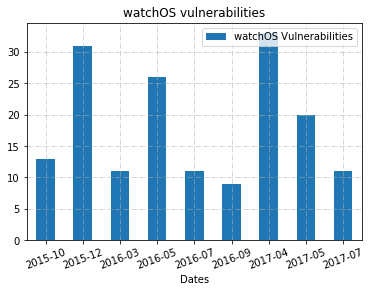

In [7]:
#watchOS vulnerabilities plot from 2015-10 to 2017-07

counts.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen_exp_bar_1.eps', format='eps', dpi=1000)
plt.show()

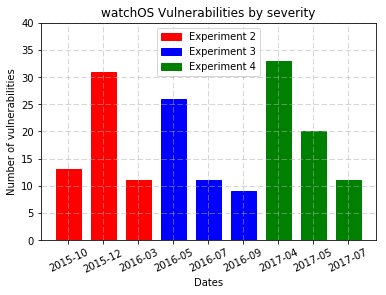

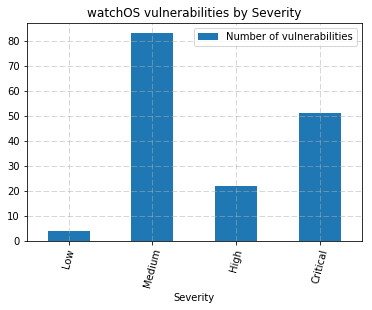

In [8]:
#watchOs vulnerability Plot by severity
groupSeverity=watchData.groupby(by='Severity').count()
severityCount=groupSeverity["cve-entry"]
severityCount.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities by Severity')
plt.xticks(rotation=75)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen2.eps', format='eps', dpi=1000)
plt.show()

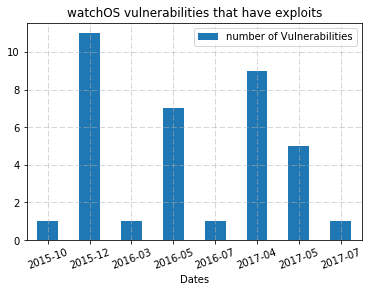

In [9]:
#watchOS vulnerabilities plot that have exploits
counts_with_exploits.plot(kind="bar",label="number of Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities that have exploits')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
#plt.savefig('imagen_exp_bar_1.eps', format='eps', dpi=1000)
plt.show()

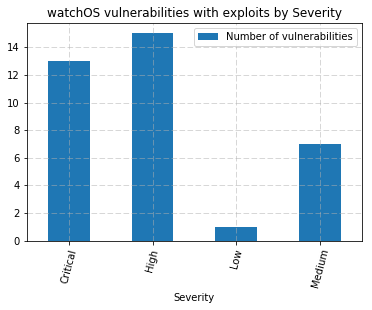

In [10]:
#plot of watchOS vulnerabilities that have exploits by severity
groupSeverity_with_exploits=watchData_with_exploits.groupby(by='Severity').count()
severityCount_with_exploits=groupSeverity_with_exploits["cve-entry"]
severityCount_with_exploits.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities with exploits by Severity')
plt.xticks(rotation=75)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen2.eps', format='eps', dpi=1000)
plt.show()

In [11]:
#SUM OF CVSS-Score to apply our metric without considering exploit factor
security=watchData["cvss-score"].sum()
print("Result without considering exploit factor: ",security)

Result without considering exploit factor:  1153.2


In [12]:
#Metric aplicattion assuming that there are no exploits for each vulnerability
security=watchData["cvss-score"].sum() * 0.1
print("Result assuming that we have no exploits: ",security)

Result assuming that we have no exploits:  115.32


In [13]:
#Metric application considering the real values of exploit verification on dataframe
watchData_wexploits["exploit_value"]=watchData_wexploits["exploit_verification"].apply(lambda x: 0.1 if x==0 else 0.7 if x==1 else 1)
result=(watchData_wexploits["cvss-score"] * watchData_wexploits["exploit_value"]).sum()
print("Result with exploits: ",result)

Result with exploits:  369.96


c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


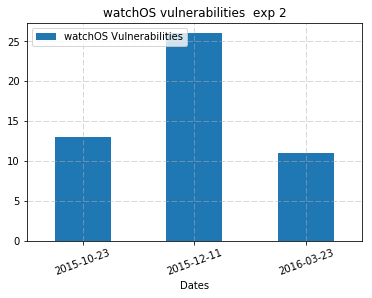

In [14]:
#watchOs vulnerabilities plot for experiment 2 
watch1=data[(data["summary"].str.contains("watch")) & (data["vuln-products"].str.contains("watchos"))]
watch1["published-date"]=watch1["published-date"].apply(lambda x: x[:10])
#watch1["published-date"]=watch1["published-date"].apply(lambda x: pd.datetime.strptime(x, '%Y-%m-%d'))
watch1=watch1[watch1["published-date"]<="2016-03-31"]
exp1=watch1.groupby(by='published-date').count()
exp1=exp1["cve-entry"]
exp1.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities  exp 2')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig("exp2_vulnerabilities.eps", format='eps', dpi=1000)
plt.show()

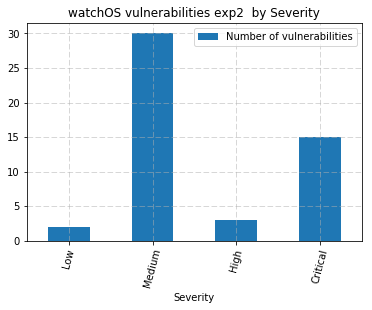

total number of vulnerabilities:  50


In [15]:
#watchOs vulnerabilities by severity plot of experiment 2
group1=watch1.groupby(by='Severity').count()
severity1=group1["cve-entry"]
severity1.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities exp2  by Severity')
plt.xticks(rotation=75)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen4.eps', format='eps', dpi=1000)
plt.show()
print("total number of vulnerabilities: ",severity1.sum())

In [16]:
#Metric value of experiment 2 WITHOUT considering exploit factor
security1=watch1["cvss-score"].sum()
security1

359.19999999999999

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


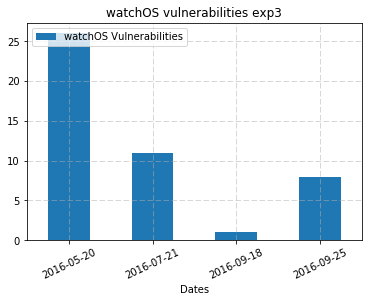

In [17]:
#watchOS vulnerability plot of experiment 3
watch2=data[(data["summary"].str.contains("watch")) & (data["vuln-products"].str.contains("watchos"))]
watch2["published-date"]=watch2["published-date"].apply(lambda x: x[:10])
#watch2["published-date"]=watch2["published-date"].apply(lambda x: pd.datetime.strptime(x, '%Y-%m-%d'))
watch2=watch2[(watch2["published-date"]>="2016-04-01") & (watch2["published-date"]<="2016-09-31")]
exp2=watch2.groupby(by='published-date').count()
exp2=exp2["cve-entry"]
exp2.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities exp3')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=25)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig("exp3_vulnerabilities.eps", format='eps', dpi=1000)
plt.show()

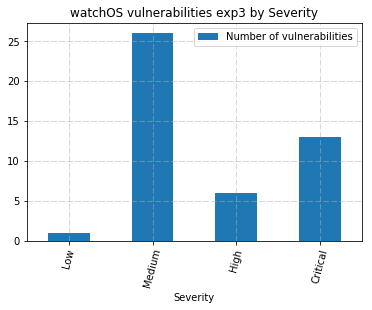

total number of vulnerabilities:  46


In [18]:
#watchOS vulnerability plot by severity of experiment 3
group2=watch2.groupby(by='Severity').count()
severity2=group2["cve-entry"]
severity2.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities exp3 by Severity')
plt.xticks(rotation=75)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen6.eps', format='eps', dpi=1000)
plt.show()
print("total number of vulnerabilities: ",severity2.sum())

In [19]:
#Metric value of experiment 3 WITHOUT considering exploit factor
security2=watch2["cvss-score"].sum()
security2

317.10000000000008

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


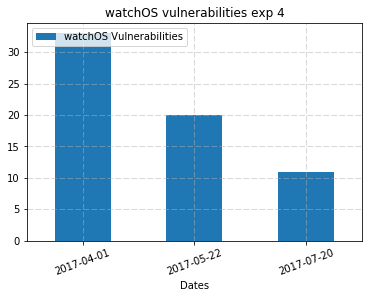

In [20]:
#watchOs vulnerability plot of experiment 4
watch3=data[(data["summary"].str.contains("watch")) & (data["vuln-products"].str.contains("watchos"))]
watch3["published-date"]=watch3["published-date"].apply(lambda x: x[:10])
#watch3["published-date"]=watch3["published-date"].apply(lambda x: pd.datetime.strptime(x, '%Y-%m-%d'))
watch3=watch3[(watch3["published-date"]>="2017-04-01")]
exp3=watch3.groupby(by='published-date').count()
exp3=exp3["cve-entry"]
exp3.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities exp 4')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig("exp4_vulnerabilities.eps", format='eps', dpi=1000)
plt.show()

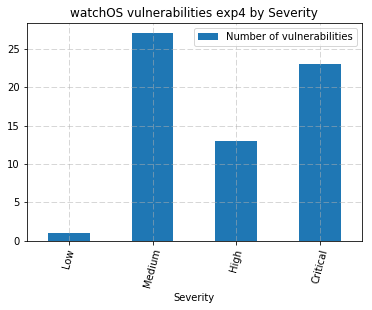

total number of vulnerabilities:  64


In [21]:
#watchOS vulnerabilities plot by severity of experiment 4
group3=watch3.groupby(by='Severity').count()
severity3=group3["cve-entry"]
severity3.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities exp4 by Severity')
plt.xticks(rotation=75)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen8.eps', format='eps', dpi=1000)
plt.show()
print("total number of vulnerabilities: ",severity3.sum())

In [22]:
#Metric value of experiment 4 WITHOUT considering exploit factor
security3=watch3["cvss-score"].sum()
security3

476.89999999999998

In [23]:
#Metric value of each experiment considering exploit factor 
#We assuming on this part that none of the vulnerabilities have exploits, so each of them are multiplied by 0.1 (explanation on paper document)
security=watchData["cvss-score"] * 0.1
security1=watch1["cvss-score"] * 0.1
security2=watch2["cvss-score"] * 0.1
security3=watch3["cvss-score"] * 0.1
security=security.sum()
security1=security1.sum()
security2=security2.sum()
security3=security3.sum()
print("Metric value of entire dataset (exp1): ",security)
print("Metric value of exp2: ",security1)
print("Metric value of exp3: ",security2)
print("Metric value of exp4: ",security3)



Metric value of entire dataset (exp1):  115.32
Metric value of exp2:  35.92
Metric value of exp3:  31.71
Metric value of exp4:  47.69


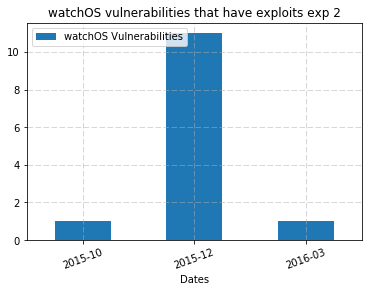

In [24]:
#Experiment with dataset of experiment 2 with exploits

watch1_wexploits=watchData_with_exploits[(watchData_with_exploits["summary"].str.contains("watch")) & (watchData_with_exploits["vuln-products"].str.contains("watchos"))]
watch1_wexploits["published-date"]=watch1_wexploits["published-date"].apply(lambda x: x[:10])
#watch1_wexploits["published-date"]=watch1_wexploits["published-date"].apply(lambda x: pd.datetime.strptime(x, '%Y-%m-%d'))
watch1_wexploits=watch1_wexploits[watch1_wexploits["published-date"]<="2016-03-31"]
exp1_wexploits=watch1_wexploits.groupby(by='published-date').count()
exp1_wexploits=exp1_wexploits["cve-entry"]
exp1_wexploits.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities that have exploits exp 2')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig("exp2_vulnerabilities.eps", format='eps', dpi=1000)
plt.show()

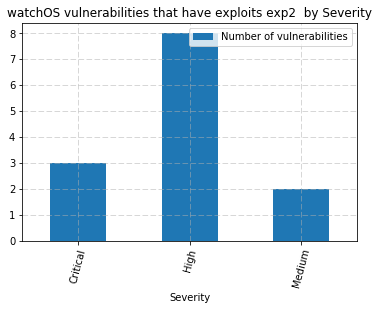

total number of vulnerabilities:  13


In [25]:
#watchOS vulnerabilities that have exploits by severity plot of experiment 2
group1_wexploits=watch1_wexploits.groupby(by='Severity').count()
severity1_wexploits=group1_wexploits["cve-entry"]
severity1_wexploits.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities that have exploits exp2  by Severity')
plt.xticks(rotation=75)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('imagen4.eps', format='eps', dpi=1000)
plt.show()
print("total number of vulnerabilities: ",severity1_wexploits.sum())

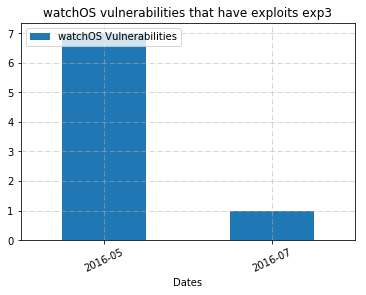

In [26]:
#Experiment with dataset of experiment 3 with exploits

watch2_wexploits=watchData_with_exploits[(watchData_with_exploits["summary"].str.contains("watch")) & (watchData_with_exploits["vuln-products"].str.contains("watchos"))]
watch2_wexploits["published-date"]=watch2_wexploits["published-date"].apply(lambda x: x[:10])
#watch2_wexploits["published-date"]=watch2_wexploits["published-date"].apply(lambda x: pd.datetime.strptime(x, '%Y-%m-%d'))
watch2_wexploits=watch2_wexploits[(watch2_wexploits["published-date"]>="2016-04-01") & (watch2_wexploits["published-date"]<="2016-09-31")]
exp2_wexploits=watch2_wexploits.groupby(by='published-date').count()
exp2_wexploits=exp2_wexploits["cve-entry"]
exp2_wexploits.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities that have exploits exp3')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=25)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig("exp3_vulnerabilities_wexploits.eps", format='eps', dpi=1000)
plt.show()

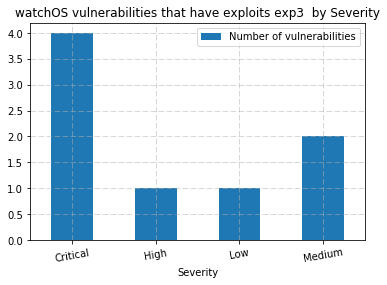

total number of vulnerabilities:  8


In [45]:
#watchOS vulnerabilities that have exploits by severity plot of experiment 3
group2_wexploits=watch2_wexploits.groupby(by='Severity').count()
severity2_wexploits=group2_wexploits["cve-entry"]
severity2_wexploits.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities that have exploits exp3  by Severity')
plt.xticks(rotation=10)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('exp3_severity_wexploits.eps', format='eps', dpi=1000)
plt.show()
print("total number of vulnerabilities: ",severity2_wexploits.sum())

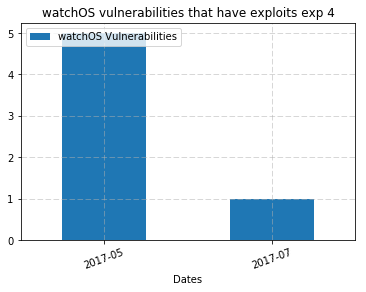

In [28]:
#Experiment with dataset of experiment 4 with exploits

watch3_wexploits=watchData_with_exploits[(watchData_with_exploits["summary"].str.contains("watch")) & (watchData_with_exploits["vuln-products"].str.contains("watchos"))]
watch3_wexploits["published-date"]=watch3_wexploits["published-date"].apply(lambda x: x[:10])
#watch3_wexploits["published-date"]=watch3_wexploits["published-date"].apply(lambda x: pd.datetime.strptime(x, '%Y-%m-%d'))
watch3_wexploits=watch3_wexploits[(watch3_wexploits["published-date"]>="2017-04-01")]
exp3_wexploits=watch3_wexploits.groupby(by='published-date').count()
exp3_wexploits=exp3_wexploits["cve-entry"]
exp3_wexploits.plot(kind="bar",label="watchOS Vulnerabilities")
plt.xlabel('Dates')
plt.title('watchOS vulnerabilities that have exploits exp 4')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig("exp4_vulnerabilities_wexploits.eps", format='eps', dpi=1000)
plt.show()

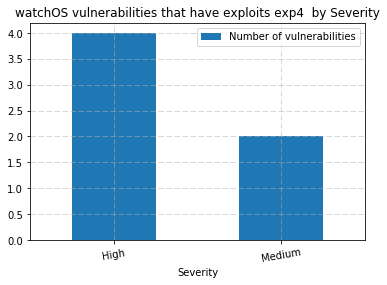

total number of vulnerabilities:  6


In [29]:
#watchOS vulnerabilities that have exploits by severity plot of experiment 4
group3_wexploits=watch3_wexploits.groupby(by='Severity').count()
severity3_wexploits=group3_wexploits["cve-entry"]
severity3_wexploits.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.title('watchOS vulnerabilities that have exploits exp4  by Severity')
plt.xticks(rotation=10)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('exp3_severity_wexploits.eps', format='eps', dpi=1000)
plt.show()
print("total number of vulnerabilities: ",severity3_wexploits.sum())

In [42]:
#Evaluating the experiments with new metric. We only considered vulnerabilities that have exploits (either verified or not)
watch1_wexploits["exploit_value"]=watch1_wexploits["exploit_verification"].apply(lambda x: 1 if x=="2" else 0.7 if x=="1" else 0.1)
watch2_wexploits["exploit_value"]=watch2_wexploits["exploit_verification"].apply(lambda x: 1 if x=="2" else 0.7 if x=="1" else 0.1)
watch3_wexploits["exploit_value"]=watch3_wexploits["exploit_verification"].apply(lambda x: 1 if x=="2" else 0.7 if x=="1" else 0.1)


security1_wexploits= watch1_wexploits["cvss-score"] * watch1_wexploits["exploit_value"]
security2_wexploits= watch2_wexploits["cvss-score"] * watch2_wexploits["exploit_value"]
security3_wexploits= watch3_wexploits["cvss-score"] * watch3_wexploits["exploit_value"]
security1_wexploits=security1_wexploits.sum()
security2_wexploits=security2_wexploits.sum()
security3_wexploits=security3_wexploits.sum()
print("Evaluating metric with vulnerabilities that have exploits")
print("Metric value of exp2: ",security1_wexploits)
print("Metric value of exp3: ",security2_wexploits)
print("Metric value of exp4: ",security3_wexploits)

Evaluating metric with vulnerabilities that have exploits
Metric value of exp2:  97.06
Metric value of exp3:  60.6
Metric value of exp4:  43.7


In [32]:
#Evaluating the experiments with new metric. We are considering here all vulnerabilites 
watch1=watchData_wexploits[(watchData_wexploits["summary"].str.contains("watch")) & (watchData_wexploits["vuln-products"].str.contains("watchos"))]
watch1["published-date"]=watch1["published-date"].apply(lambda x: x[:10])
watch1=watch1[watch1["published-date"]<="2016-03-31"]

watch2=watchData_wexploits[(watchData_wexploits["summary"].str.contains("watch")) & (watchData_wexploits["vuln-products"].str.contains("watchos"))]
watch2["published-date"]=watch2["published-date"].apply(lambda x: x[:10])
watch2=watch2[(watch2["published-date"]>="2016-04-01") & (watch2["published-date"]<="2016-09-31")]

watch3=watchData_wexploits[(watchData_wexploits["summary"].str.contains("watch")) & (watchData_wexploits["vuln-products"].str.contains("watchos"))]
watch3["published-date"]=watch3["published-date"].apply(lambda x: x[:10])
watch3=watch3[(watch3["published-date"]>="2017-04-01")]

watch1["exploit_value"]=watch1["exploit_verification"].apply(lambda x: 1 if x==2.0 else 0.7 if x==1.0 else 0.1)
watch2["exploit_value"]=watch2["exploit_verification"].apply(lambda x: 1 if x==2.0 else 0.7 if x==1.0 else 0.1)
watch3["exploit_value"]=watch3["exploit_verification"].apply(lambda x: 1 if x==2.0 else 0.7 if x==1.0 else 0.1)


security1= watch1["cvss-score"] * watch1["exploit_value"]
security2= watch2["cvss-score"] * watch2["exploit_value"]
security3= watch3["cvss-score"] * watch3["exploit_value"]
security1=security1.sum()
security2=security2.sum()
security3=security3.sum()
print("----Evaluating metric considering all vulnerabilities----")
print("Metric value of exp2: ",security1)
print("Metric value of exp3: ",security2)
print("Metric value of exp4: ",security3)

----Evaluating metric considering all vulnerabilities----
Metric value of exp2:  126.67
Metric value of exp3:  86.25
Metric value of exp4:  62.45


On this part of the work , we compared two IP Cameras, analyzing their vulnerabilities and exploits. Finally, we show the results.

In [152]:
#Extracting vulnerabilities of D-Link DCS IP CAMERA
camera_dlink_vuln=joined_data2[(joined_data2["summary"].str.contains("D-Link DCS"))]
camera_dlink_vuln["published-date"]=camera_dlink_vuln["published-date"].apply(lambda x: x[:7])
camera_dlink_vuln["published-date"]=camera_dlink_vuln["published-date"].apply(dateparse)
camera_dlink_vuln["exploit_verification"]=camera_dlink_vuln["exploit_verification"].apply(lambda x: "0" if math.isnan(float(x)) else x)
grouped_dlink_by_date=camera_dlink_vuln.groupby(by='published-date').count()
dlink_vuln_counts=grouped_dlink_by_date["cve-entry"]
camera_dlink_vuln

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity,description,platform,exploit_verification,date_published,exploit_id,type
4856,CVE-2017-7852,D-Link DCS cameras have a weak/insecure CrossD...,cpe:/o:d-link:dcs-5010l_firmware:1.13.05 cpe:/...,2017-04-01,2017-05-08 15:42:15,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2017-05-08 11:25:58,Medium,D-Link DCS Series Cameras - Insecure Crossdomain,Hardware,1,2017-02-22,42074,Webapps
17030,CVE-2015-2048,Cross-site request forgery (CSRF) vulnerabilit...,cpe:/o:d-link:dcs-931l_firmware:1.04,2015-02-01,2015-02-24 12:18:01,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2015-02-24 10:02:29,Medium,NaN,NaN,0,NaN,NaN,NaN
17031,CVE-2015-2049,Unrestricted file upload vulnerability in D-Li...,cpe:/o:d-link:dcs-931l_firmware:1.04,2015-02-01,2015-11-24 11:54:48,9.0,NETWORK,LOW,SINGLE_INSTANCE,COMPLETE,COMPLETE,COMPLETE,2015-11-24 10:15:00,Critical,D-Link DCS-931L - Arbitrary File Upload (Metas...,Hardware,2,2016-01-07,39192,Webapps
40557,CVE-2012-4046,The D-Link DCS-932L camera with firmware 1.02 ...,cpe:/o:d-link:dcs-932l_firmware:1.02 cpe:/h:d-...,2012-12-01,2015-03-18 12:55:53,3.3,ADJACENT_NETWORK,LOW,NONE,PARTIAL,NONE,NONE,2015-03-18 11:07:46,Low,NaN,NaN,0,NaN,NaN,NaN
41638,CVE-2012-5306,Stack-based buffer overflow in the SelectDirec...,cpe:/a:d-link:camera_stream_client_activex_con...,2012-10-01,2012-10-08 00:00:00,9.3,NETWORK,MEDIUM,NONE,COMPLETE,COMPLETE,COMPLETE,2012-10-08 14:56:00,Critical,D-Link DCS-5605 Network Surveillance - ActiveX...,Hardware,2,2012-03-28,18673,Remote
41651,CVE-2012-5319,Cross-site request forgery (CSRF) vulnerabilit...,cpe:/h:dlink:dcs-2000:- cpe:/h:dlink:dcs-900:-...,2012-10-01,2012-10-09 00:00:00,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2012-10-09 14:40:00,Medium,Multiple D-Link DCS Products - 'security.cgi' ...,Hardware,2,2012-02-23,36877,Remote
41652,CVE-2012-5319,Cross-site request forgery (CSRF) vulnerabilit...,cpe:/h:dlink:dcs-2000:- cpe:/h:dlink:dcs-900:-...,2012-10-01,2012-10-09 00:00:00,6.8,NETWORK,MEDIUM,NONE,PARTIAL,PARTIAL,PARTIAL,2012-10-09 14:40:00,Medium,D-Link DCS Series - Cross-Site Request Forgery...,Hardware,1,2012-02-22,18509,Webapps
52279,CVE-2010-4964,recorder_test.cgi on the D-Link DCS-2121 camer...,cpe:/h:dlink:dcs-2121 cpe:/a:dlink:dcs-2121_fi...,2011-10-01,2012-05-14 00:00:00,9.0,NETWORK,LOW,SINGLE_INSTANCE,COMPLETE,COMPLETE,COMPLETE,2011-10-17 07:23:00,Critical,NaN,NaN,0,NaN,NaN,NaN
52280,CVE-2010-4965,/etc/rc.d/rc.local on the D-Link DCS-2121 came...,cpe:/h:dlink:dcs-2121 cpe:/a:dlink:dcs-2121_fi...,2011-10-01,2012-05-14 00:00:00,9.0,NETWORK,LOW,SINGLE_INSTANCE,COMPLETE,COMPLETE,COMPLETE,2011-10-17 08:04:00,Critical,NaN,NaN,0,NaN,NaN,NaN


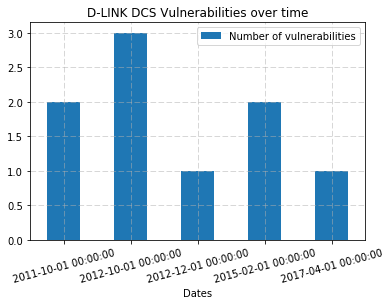

Number of vulnerabilities without exploits:  4
Number of vulnerabilities with exploits:  5


In [153]:
#D-Link DCS vulnerabilities plot 
dlink_vuln_counts.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Dates')
plt.xticks(rotation=15)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('dlink_vulnerabilities_overtime.eps', format='eps', dpi=1000)
plt.title('D-LINK DCS Vulnerabilities over time')
plt.show()

print("Number of vulnerabilities without exploits: ",len(camera_dlink_vuln[camera_dlink_vuln["exploit_verification"]=="0"]))
print("Number of vulnerabilities with exploits: ",len(camera_dlink_vuln[camera_dlink_vuln["exploit_verification"]!="0"]))

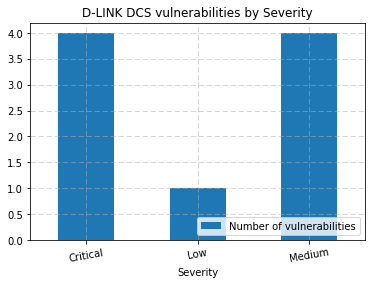

Number of vulnerabilities:  9


In [154]:
#D-Link vulnerabilities plot by severity
grouped_dlink_by_severity=camera_dlink_vuln.groupby(by='Severity').count()
dlink_severity_count=grouped_dlink_by_severity["cve-entry"]
dlink_severity_count.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.xticks(rotation=10)
plt.legend(loc='lower right')
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.savefig('dlink_vulnerabilities_byseverity.eps', format='eps', dpi=1000)
plt.title('D-LINK DCS vulnerabilities by Severity')
plt.show()
print("Number of vulnerabilities: ",dlink_severity_count.sum())

In [155]:
#Extracting vulnerabilities of FOSCAM IP CAMERA
camera_Foscam_vuln=joined_data2[(joined_data2["summary"].str.contains("Foscam"))]
camera_Foscam_vuln["published-date"]=camera_Foscam_vuln["published-date"].apply(lambda x: x[:7])
camera_Foscam_vuln["published-date"]=camera_Foscam_vuln["published-date"].apply(dateparse)
camera_Foscam_vuln["exploit_verification"]=camera_Foscam_vuln["exploit_verification"].apply(lambda x: "0" if math.isnan(float(x)) else x)
grouped_Foscam_by_date=camera_Foscam_vuln.groupby(by='published-date').count()
foscam_vuln_counts=grouped_Foscam_by_date["cve-entry"]
camera_Foscam_vuln

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using 

,cve-entry,summary,vuln-products,published-date,last-modified-date,cvss-score,access-vector,access-complexity,authentication,confidentiality-impact,integrity-impact,availability-impact,generated-on-datetime,Severity,description,platform,exploit_verification,date_published,exploit_id,type
2384,CVE-2017-2805,An exploitable stack-based buffer overflow vul...,cpe:/o:foscam:c1_hd_indoor_camera_firmware:1.9...,2017-06-01,2017-07-05 11:21:42,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2017-06-29 12:44:46,High,NaN,NaN,0,NaN,NaN,NaN
2395,CVE-2017-2827,An exploitable command injection vulnerability...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-06-28 11:05:52,6.5,NETWORK,LOW,SINGLE_INSTANCE,PARTIAL,PARTIAL,PARTIAL,2017-06-27 13:39:25,Medium,NaN,NaN,0,NaN,NaN,NaN
2396,CVE-2017-2828,An exploitable command injection vulnerability...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-06-28 11:04:08,6.5,NETWORK,LOW,SINGLE_INSTANCE,PARTIAL,PARTIAL,PARTIAL,2017-06-27 14:27:08,Medium,NaN,NaN,0,NaN,NaN,NaN
2397,CVE-2017-2829,An exploitable directory traversal vulnerabili...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-06-28 11:02:45,4.0,NETWORK,LOW,SINGLE_INSTANCE,PARTIAL,NONE,NONE,2017-06-27 14:21:29,Medium,NaN,NaN,0,NaN,NaN,NaN
2398,CVE-2017-2830,An exploitable buffer overflow vulnerability e...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-06-27 13:56:56,5.0,NETWORK,LOW,NONE,NONE,PARTIAL,NONE,2017-06-27 13:16:38,Medium,NaN,NaN,0,NaN,NaN,NaN
2399,CVE-2017-2831,An exploitable buffer overflow vulnerability e...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-06-27 13:43:46,5.0,NETWORK,LOW,NONE,NONE,PARTIAL,NONE,2017-06-27 13:14:59,Medium,NaN,NaN,0,NaN,NaN,NaN
2400,CVE-2017-2841,An exploitable command injection vulnerability...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-07-05 12:50:34,6.5,NETWORK,LOW,SINGLE_INSTANCE,PARTIAL,PARTIAL,PARTIAL,2017-07-05 09:51:54,Medium,NaN,NaN,0,NaN,NaN,NaN
2401,CVE-2017-2842,In the web management interface in Foscam C1 I...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-07-05 12:52:13,6.5,NETWORK,LOW,SINGLE_INSTANCE,PARTIAL,PARTIAL,PARTIAL,2017-07-05 09:51:44,Medium,NaN,NaN,0,NaN,NaN,NaN
2402,CVE-2017-2843,In the web management interface in Foscam C1 I...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-07-03 13:22:22,7.5,NETWORK,LOW,NONE,PARTIAL,PARTIAL,PARTIAL,2017-07-03 11:58:21,High,NaN,NaN,0,NaN,NaN,NaN
2403,CVE-2017-2844,In the web management interface in Foscam C1 I...,cpe:/o:foscam:c1_indoor_hd_camera_firmware:2.5...,2017-06-01,2017-07-05 11:06:23,6.5,NETWORK,LOW,SINGLE_INSTANCE,PARTIAL,PARTIAL,PARTIAL,2017-07-03 19:24:10,Medium,NaN,NaN,0,NaN,NaN,NaN


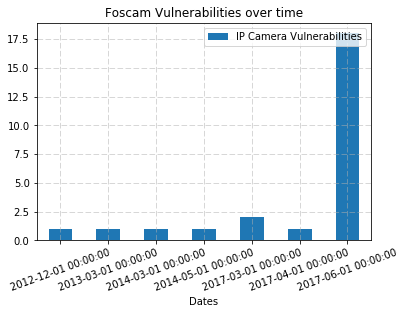

Number of vulnerabilities without exploits:  23
Number of vulnerabilities with exploits:  2


In [163]:
#Foscam vulnerabilities plot
foscam_vuln_counts.plot(kind="bar",label="IP Camera Vulnerabilities")
plt.xlabel('Dates')
plt.plot(color='red',label='watchOS')
plt.xticks(rotation=20)
plt.legend(loc='upper right')
plt.grid(True,linestyle='dashed', linewidth=0.5)

plt.savefig('foscam_vulnerabilities_overtime.eps', format='eps', dpi=1000)
plt.title('Foscam Vulnerabilities over time')

plt.show()

print("Number of vulnerabilities without exploits: ",len(camera_Foscam_vuln[camera_Foscam_vuln["exploit_verification"]=="0"]))
print("Number of vulnerabilities with exploits: ",len(camera_Foscam_vuln[camera_Foscam_vuln["exploit_verification"]!="0"]))

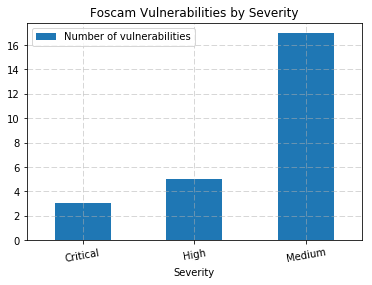

Number of vulnerabilities:  25


In [164]:
#Foscam vulnerabilities plot by severity
grouped_foscam_by_severity=camera_Foscam_vuln.groupby(by='Severity').count()
foscam_severity_count=grouped_foscam_by_severity["cve-entry"]
foscam_severity_count.plot(kind="bar",label="Number of vulnerabilities")
plt.xlabel('Severity')
plt.xticks(rotation=10)
plt.legend(loc='upper left')
plt.grid(True,linestyle='dashed', linewidth=0.5)

plt.savefig('foscam_vulnerabilities_byseverity.eps', format='eps', dpi=1000)
plt.title('Foscam Vulnerabilities by Severity')

plt.show()

print("Number of vulnerabilities: ",foscam_severity_count.sum())

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


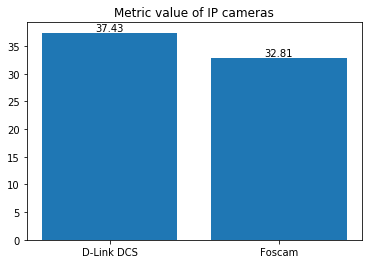

Metric value of D-Link DCS:  37.43
Metric value of Foscam:  32.81


In [166]:
#Metric evaluation of IP Cameras

camera_dlink_vuln["exploit_value"]=camera_dlink_vuln["exploit_verification"].apply(lambda x: 1 if x=="2" else 0.7 if x=="1" else 0.1)
camera_Foscam_vuln["exploit_value"]=camera_Foscam_vuln["exploit_verification"].apply(lambda x: 1 if x=="2" else 0.7 if x=="1" else 0.1)

security_dlink= camera_dlink_vuln["cvss-score"] * camera_dlink_vuln["exploit_value"]
security_foscam= camera_Foscam_vuln["cvss-score"] * camera_Foscam_vuln["exploit_value"]

security_dlink=security_dlink.sum()
security_foscam=security_foscam.sum()

ip_camera_metric_values=[security_dlink,security_foscam]
order=[0,1]
fig, ax=plt.subplots()
plt.bar(order,ip_camera_metric_values)
plt.xticks(order,["D-Link DCS","Foscam"])

rects = ax.patches

for rect, v in zip(rects,ip_camera_metric_values):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height, str(v), ha='center', va='bottom')

    
plt.savefig('ip_cameras_metric_values_bars.eps', format='eps', dpi=1000)

plt.title("Metric value of IP cameras")

plt.show()
print("Metric value of D-Link DCS: ",security_dlink)
print("Metric value of Foscam: ",security_foscam)

Now, we will leave this appendix of previous plots for a better visualization and interpretation

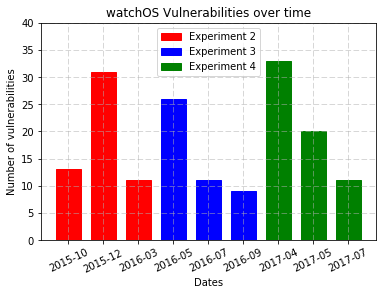

In [167]:
dates=[]
values=[]
for date,value in counts.items():
    dates.append(date)
    values.append(value)

width = 0.70
ind = [i for i in range(len(dates))]

p1 = plt.bar(ind, values, width, color='blue')

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Dates')
plt.xticks(ind, dates)
plt.yticks(np.arange(0, 41, 5))
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.xticks(rotation=25)
p1[0].set_color('r')
p1[1].set_color('r')
p1[2].set_color('r')
p1[3].set_color('b')
p1[4].set_color('b')
p1[5].set_color('b')
p1[6].set_color('g')
p1[7].set_color('g')
p1[8].set_color('g')
plt.legend((p1[0],p1[3],p1[6]), ('Experiment 2','Experiment 3','Experiment 4'))
plt.savefig('watchOS_vulnerabilities_mulitcolor_bars.eps', format='eps', dpi=1000)
plt.title('watchOS Vulnerabilities over time')

plt.show()

In [99]:
#We declare this function to re-arrange the values from a grouped dataframe by Severity to a list values 
#So, we can pass this list to matplotlib for plotting stacked bars
def transformDFToSeverityList(grouped_df):
    list_values=[0,0,0,0]
    for index,val in grouped_df.items():
        if index=="Low":
                list_values[0]=val
        elif index=="Medium":
                list_values[1]=val
        elif index=="High":
                list_values[2]=val
        elif index=="Critical":
                list_values[3]=val
    return list_values
        

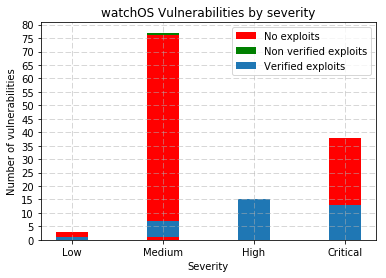

In [138]:
#Bar plots of watchOS vulnerabilities using stacks bars
watchOS_nonexploits=watchData_wexploits[watchData_wexploits["exploit_verification"]==0.0]
watchOS_nonverified=watchData_wexploits[watchData_wexploits["exploit_verification"]==1.0]
watchOS_verified=watchData_wexploits[watchData_wexploits["exploit_verification"]==2.0]

group_nonexploits=watchOS_nonexploits.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_nonverified=watchOS_nonverified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_verified=watchOS_verified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")


#Reordering lists to get values from Low to Critical
"""
group_nonexploits= group_nonexploits.tolist()
group_nonverified= group_nonverified.tolist()
group_verified= group_verified.tolist()

group_nonexploits.reverse()
group_nonexploits.insert(0,group_nonexploits.pop(1))
group_nonverified.insert(0,0)
group_nonverified.insert(2,0)
group_nonverified.insert(3,0)
group_verified.reverse()
group_verified.insert(0,group_verified.pop(1))
"""
group_nonexploits=transformDFToSeverityList(group_nonexploits)
group_nonverified=transformDFToSeverityList(group_nonverified)
group_verified=transformDFToSeverityList(group_verified)

width = 0.35
ind = [0,1,2,3]

p1 = plt.bar(ind, group_nonexploits, width, color='red')
p2 = plt.bar(ind, group_nonverified, width,color='green',bottom=group_nonexploits)
p3=plt.bar(ind,group_verified,width,bottom=group_nonverified)

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Severity')
plt.xticks(ind, ('Low', 'Medium', 'High', 'Critical'))
plt.yticks(np.arange(0, 81, 5))  #If you want to change the value range on Y-axis, modify this  line (start,end,steps)
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.legend((p1[0], p2[0],p3[0]), ('No exploits', 'Non verified exploits','Verified exploits'))

plt.savefig('watchOS_vulnerabilities_by_severity_stacked_bars.eps', format='eps', dpi=1000)

plt.title('watchOS Vulnerabilities by severity')
plt.show()


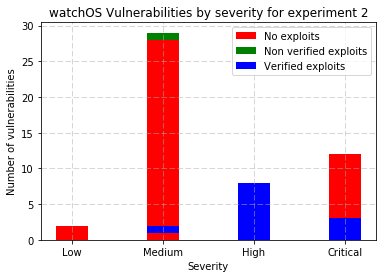

In [139]:
#Bar plots of watchOS vulnerabilities experiment 2 using stacks bars
watchOS_exp2_nonexploits=watch1[watch1["exploit_verification"]==0.0]
watchOS_exp2_nonverified=watch1[watch1["exploit_verification"]==1.0]
watchOS_exp2_verified=watch1[watch1["exploit_verification"]==2.0]

group_exp2_nonexploits=watchOS_exp2_nonexploits.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_exp2_nonverified=watchOS_exp2_nonverified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_exp2_verified=watchOS_exp2_verified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")

list_exp2_nonexploits=transformDFToSeverityList(group_exp2_nonexploits)
list_exp2_nonverified=transformDFToSeverityList(group_exp2_nonverified)
list_exp2_verified=transformDFToSeverityList(group_exp2_verified)

width = 0.35
ind = [0,1,2,3]

p1 = plt.bar(ind, list_exp2_nonexploits, width, color='red')
p2 = plt.bar(ind, list_exp2_nonverified, width,color='green',bottom=list_exp2_nonexploits)
p3=plt.bar(ind,list_exp2_verified,width,color='blue',bottom=list_exp2_nonverified)

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Severity')
plt.xticks(ind, ('Low', 'Medium', 'High', 'Critical'))
plt.yticks(np.arange(0, 31, 5))
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.legend((p1[0], p2[0],p3[0]), ('No exploits', 'Non verified exploits','Verified exploits'))

plt.savefig('watchOS_vulnerabilities_by_severity_experiment2_stacked_bars.eps', format='eps', dpi=1000)
plt.title('watchOS Vulnerabilities by severity for experiment 2')

plt.show()

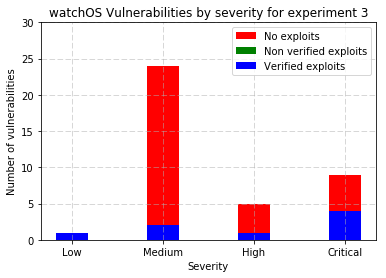

In [140]:
#Bar plots of watchOS vulnerabilities experiment 3 using stacks bars
watchOS_exp3_nonexploits=watch2[watch2["exploit_verification"]==0.0]
watchOS_exp3_nonverified=watch2[watch2["exploit_verification"]==1.0]
watchOS_exp3_verified=watch2[watch2["exploit_verification"]==2.0]

group_exp3_nonexploits=watchOS_exp3_nonexploits.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_exp3_nonverified=watchOS_exp3_nonverified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_exp3_verified=watchOS_exp3_verified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")

list_exp3_nonexploits=transformDFToSeverityList(group_exp3_nonexploits)
list_exp3_nonverified=transformDFToSeverityList(group_exp3_nonverified)
list_exp3_verified=transformDFToSeverityList(group_exp3_verified)

width = 0.35
ind = [0,1,2,3]

p1 = plt.bar(ind, list_exp3_nonexploits, width, color='red')
p2 = plt.bar(ind, list_exp3_nonverified, width,color='green',bottom=list_exp3_nonexploits)
p3=plt.bar(ind,list_exp3_verified,width,color='blue',bottom=list_exp3_nonverified)

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Severity')
plt.xticks(ind, ('Low', 'Medium', 'High', 'Critical'))
plt.yticks(np.arange(0, 31, 5))
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.legend((p1[0], p2[0],p3[0]), ('No exploits', 'Non verified exploits','Verified exploits'))

plt.savefig('watchOS_vulnerabilities_by_severity_experiment3_stacked_bars.eps', format='eps', dpi=1000)
plt.title('watchOS Vulnerabilities by severity for experiment 3')

plt.show()

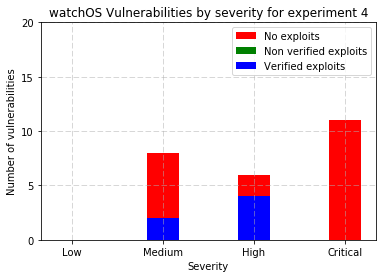

In [141]:
#Bar plots of watchOS vulnerabilities experiment 4 using stacks bars
watchOS_exp4_nonexploits=watch3[watch3["exploit_verification"]==0.0]
watchOS_exp4_nonverified=watch3[watch3["exploit_verification"]==1.0]
watchOS_exp4_verified=watch3[watch3["exploit_verification"]==2.0]

group_exp4_nonexploits=watchOS_exp4_nonexploits.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_exp4_nonverified=watchOS_exp4_nonverified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_exp4_verified=watchOS_exp4_verified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")

list_exp4_nonexploits=transformDFToSeverityList(group_exp4_nonexploits)
list_exp4_nonverified=transformDFToSeverityList(group_exp4_nonverified)
list_exp4_verified=transformDFToSeverityList(group_exp4_verified)

width = 0.35
ind = [0,1,2,3]

p1 = plt.bar(ind, list_exp4_nonexploits, width, color='red')
p2 = plt.bar(ind, list_exp4_nonverified, width,color='green',bottom=list_exp4_nonexploits)
p3=plt.bar(ind,list_exp4_verified,width,color='blue',bottom=list_exp4_nonverified)

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Severity')
plt.xticks(ind, ('Low', 'Medium', 'High', 'Critical'))
plt.yticks(np.arange(0, 21, 5))
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.legend((p1[0], p2[0],p3[0]), ('No exploits', 'Non verified exploits','Verified exploits'))

plt.savefig('watchOS_vulnerabilities_by_severity_experiment4_stacked_bars.eps', format='eps', dpi=1000)
plt.title('watchOS Vulnerabilities by severity for experiment 4')


plt.show()

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


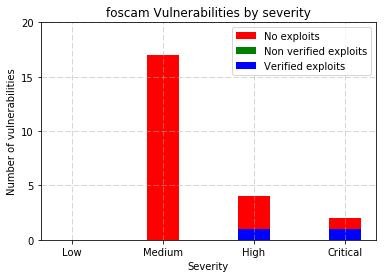

In [144]:
#Bar plots of foscam vulnerabilities using stacks bars

foscam_nonexploits=camera_Foscam_vuln[camera_Foscam_vuln["exploit_verification"]=="0"]
foscam_nonverified=camera_Foscam_vuln[camera_Foscam_vuln["exploit_verification"]=="1"]
foscam_verified=camera_Foscam_vuln[camera_Foscam_vuln["exploit_verification"]=="2"]

group_nonexploits=foscam_nonexploits.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_nonverified=foscam_nonverified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_verified=foscam_verified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")

list_nonexploits=transformDFToSeverityList(group_nonexploits)
list_nonverified=transformDFToSeverityList(group_nonverified)
list_verified=transformDFToSeverityList(group_verified)

width = 0.35
ind = [0,1,2,3]

p1 = plt.bar(ind, list_nonexploits, width, color='red')
p2 = plt.bar(ind, list_nonverified, width,color='green',bottom=list_nonexploits)
p3=plt.bar(ind,list_verified,width,color='blue',bottom=list_nonverified)

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Severity')
plt.xticks(ind, ('Low', 'Medium', 'High', 'Critical'))
plt.yticks(np.arange(0, 21, 5))
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.legend((p1[0], p2[0],p3[0]), ('No exploits', 'Non verified exploits','Verified exploits'))

plt.savefig('foscam_vulnerabilities_byseverity_stacked_bars.eps', format='eps', dpi=1000)

plt.title('foscam Vulnerabilities by severity')

plt.show()

c:\program files (x86)\python35-32\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


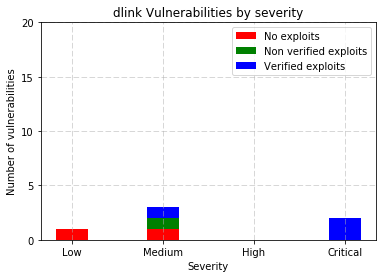

In [145]:
#Bar plots of dlink vulnerabilities using stacks bars
dlink_nonexploits=camera_dlink_vuln[camera_dlink_vuln["exploit_verification"]=="0"]
dlink_nonverified=camera_dlink_vuln[camera_dlink_vuln["exploit_verification"]=="1"]
dlink_verified=camera_dlink_vuln[camera_dlink_vuln["exploit_verification"]=="2"]

group_nonexploits=dlink_nonexploits.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_nonverified=dlink_nonverified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")
group_verified=dlink_verified.groupby(by="Severity").count()["cve-entry"].rename("Severity_Count")

list_nonexploits=transformDFToSeverityList(group_nonexploits)
list_nonverified=transformDFToSeverityList(group_nonverified)
list_verified=transformDFToSeverityList(group_verified)

width = 0.35
ind = [0,1,2,3]

p1 = plt.bar(ind, list_nonexploits, width, color='red')
p2 = plt.bar(ind, list_nonverified, width,color='green',bottom=list_nonexploits)
p3=plt.bar(ind,list_verified,width,color='blue',bottom=list_nonverified)

plt.ylabel('Number of vulnerabilities')
plt.xlabel('Severity')
plt.xticks(ind, ('Low', 'Medium', 'High', 'Critical'))
plt.yticks(np.arange(0, 21, 5))
plt.grid(True,linestyle='dashed', linewidth=0.5)
plt.legend((p1[0], p2[0],p3[0]), ('No exploits', 'Non verified exploits','Verified exploits'))

plt.savefig('dlink_vulnerabilities_byseverity_stacked_bars.eps', format='eps', dpi=1000)

plt.title('dlink Vulnerabilities by severity')

plt.show()